In [2]:
import sys
!{sys.executable} -m pip install plotly

In [3]:
import numpy as np
import plotly.offline as ploff
import plotly.graph_objects as go
from scipy import constants

import plotly.io as pio
ploff.init_notebook_mode()
# pio.renderers.default = "notebook_connected"

a0 = constants.physical_constants['Bohr radius'][0]
Angstrom = constants.angstrom

In [6]:
def r_phi_theta(x, y, z):
    r = np.sqrt(x**2 + y**2 + z**2)
    phi = np.arctan2(y, x) + np.pi
    theta = np.arccos(z/r)
    return r, phi, theta

X, Y, Z = np.mgrid[-20*a0:20*a0:48j, -20*a0:20*a0:48j, -20*a0:20*a0:48j]
r_grid, phi_grid, theta_grid = r_phi_theta(X, Y, Z)

In [7]:
def probfunc(r, wavefunc):
    p = r**2 * np.conj(wavefunc) * wavefunc
    return p.real / np.max(p.real)
# The .real syntax picks off the real part of a complex number. Even though the 
# imaginary part of the probability is zero, variable p is still represented in
# the computer as a complex number. Our plotting routines will only work on
# arrays of real numbers.

In [13]:
def visualize_prob(probability_function):

    fig = go.Figure(data=go.Isosurface(
        x=X.flatten() / Angstrom, # x values of the grid in Angstroms
        y=Y.flatten() / Angstrom, # y values of the grid in Angstroms
        z=Z.flatten() / Angstrom, # z values of the grid in Angstroms
        value=probability_function.flatten(), # independent variable
        isomin=0.05, # Minimum normalized probability density to render in an isosurface
        isomax=0.95, # Maximum normalized probability density to render in an isosurface
        opacity=0.4, # Set a low opacity so each surface is partially transparent
        colorscale='Plotly3_r', # Nice-looking color table
        surface_count=8, # number of isosurfaces to plot (2 by default: only min and max)
        colorbar_nticks=8, # colorbar ticks correspond to isosurface values
        caps=dict(x_show=False, y_show=False, z_show=False))
        )

    # Change axis lables and make the plot larger than the default
    fig.update_layout(scene = dict(
                        xaxis_title='x (Angstroms)',
                        yaxis_title='y (Angstroms)',
                        zaxis_title='z (Angstroms)'),
                        width=700,
                        margin=dict(r=10, b=10, l=10, t=10))

    fig.show()

In [14]:
def visualize_prob_slice(probability_function):

    fig = go.Figure(data=go.Isosurface(
        x=X.flatten() / Angstrom, # x values of the grid in Angstroms
        y=Y.flatten() / Angstrom, # y values of the grid in Angstroms
        z=Z.flatten() / Angstrom, # z values of the grid in Angstroms
        value=probability_function.flatten(), # independent variable
        isomin=0.05, # Minimum normalized probability density to render in an isosurface
        isomax=0.95, # Maximum normalized probability density to render in an isosurface
        opacity=0.4, # Set a low opacity so each surface is partially transparent
        colorscale='Plotly3_r', # Nice-looking color table
        surface_count=8, # number of isosurfaces to plot (2 by default: only min and max)
        colorbar_nticks=8, # colorbar ticks correspond to isosurface values
        slices_x=dict(show=True, locations=[0]),
        caps=dict(x_show=False, y_show=False, z_show=False))
        )

    # Change axis lables and make the plot larger than the default
    fig.update_layout(scene = dict(
                        xaxis_title='x (Angstroms)',
                        yaxis_title='y (Angstroms)',
                        zaxis_title='z (Angstroms)'),
                        width=700,
                        margin=dict(r=10, b=10, l=10, t=10))

    fig.show()

Question 1)

The wave functions for n=1,ℓ=0,m=0 and n=2,ℓ=0,m=0 do not depend on the angular coordinates ϕ and θ because they are s-orbitals. For hydrogen atom wave functions, the total wave function can be separated into a radial part and an angular part. The angular dependence comes entirely from the spherical harmonic and for ℓ=0 and m=0, the spherical harmonic becomes a constant. Since this is just a constant number, the wave function only depends on the radial coordinate r. That means the probability density is the same in every direction, producing spherical symmetry.

Question 2)

The n=1,ℓ=0,m=0 probability function is more centrally condensed. This is because the ground-state wave function decreases exponentially away from the nucleus and has its maximum probability density very close to the proton. The n=2,ℓ=0,m=0 state is more spread out in space. It also contains a radial node, which is a region where the probability density goes to zero. Because the electron is distributed farther from the nucleus on average, the probability density near the proton is smaller than in the n=1 state. Physically, the n=1 electron is tightly bound and concentrated near the nucleus while the n=2 electron occupies a larger average radius and is less concentrated at the center.

Question 3)

Yes. The slice matches expectations because the probability function for the n=1,ℓ=0,m=0 state is spherically symmetric and smoothly decreases away from the nucleus. In the slice visualization, the highest probability density appears at the center, the density decreases continuously with increasing radius, and the circular symmetry in the slice reflects the full spherical symmetry of the orbital. This is exactly what we expect from the hydrogen ground state.

Question 4)

The main difference is that the n=2,ℓ=0,m=0 probability function contains a radial node, while the n=1,ℓ=0,m=0 probability function does not. For the n=1 state, the probability density is largest at the center, it decreases smoothly outward, and there are no zero-probability regions except infinitely far away. For the n=2 state the probability density is split into inner and outer regions, there is a spherical shell where the probability density becomes zero called a radial mode, and the orbital extends farther from the nucleus overall.The slice visualization makes the radial node much easier to see because it appears as a ring-like low-density region separating two higher-density regions.

In [29]:
#New probability function rendering

new_orbital = lambda r, theta, phi: (r**2/a0**2) * \
                                    (1 - r/(27*a0)) * \
                                    np.exp(-r/(3*a0)) * \
                                    np.sin(theta)**2 * \
                                    np.exp(2j*phi)

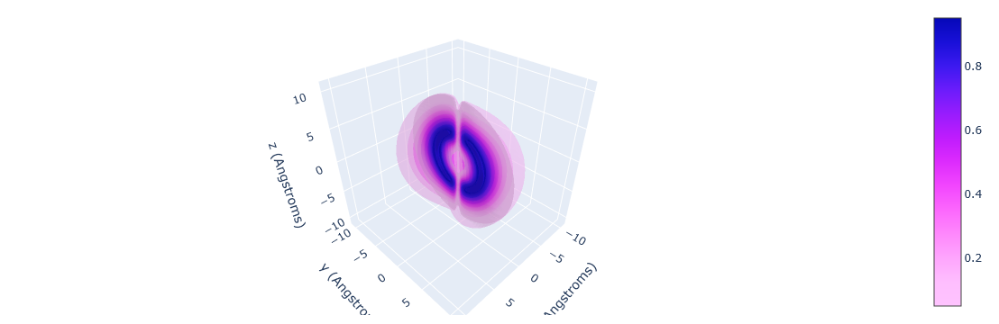

In [30]:
visualize_prob_slice(probfunc(r_grid, new_orbital(r_grid, phi_grid, theta_grid)))